# 3. Create submissions

In this notebook we will explore the datasets of the [AnDi 2 challenge](https://andi-challenge.org/challenge-2024/) and show how to properly create a submission. We will consider that you have already read [the paper](https://arxiv.org/abs/2311.18100) and know the basics of the challenge. This notebook has three sections:

- **Reading videos and trajectories: the public data -** here we will show how does the public data, upon which you need to make predictions, looks like.
- **Creating and submitting predictions -** based on the previous data, we will generate some trivial predictions and showcase the structure of a submission
- **Work on your own datasets -** we will show how to read the Starting Kit, generate new datasets with the `andi_datasets` library and score your data locally.

## Reading videos and trajectories: the public data 

First things first: you need to download the public data for prediction available in the competition [Codalab webpage (link not yet available)](XXX). We will showcase here how to do so in the *Development phase* data. For that, go to the competition, then Participate > Files and download the Public Data for Phase #1 Development. Once unzipped, the dataset should look like this:

```
public_dat
│
└─── track_1 (videos)
|   │
|   └─── exp_Y
│        │
│        └─── videos_fov_X.tiff (video for each fov)
│ 
│
└─── track_2 (trajectories)
    │
    └─── exp_Y
        │
        └─── traj_fov_X.csv (trajectories for each FOV) 
```

where `Y` goes from 0 to 9 and `X` from 0 to 29. This means that we have 10 experiments and 30 FOVs each.

In [ ]:
StartKit_path = 'public_dat/' # make sure the folder has this name or change it

### Track 1: videos

Track 1 focuses on videos. Each of the tiffs contains a video mimicking a typical single particle tracking experiment (see the paper for details). Let's load one of the videos. You can do so with the following function:

In [ ]:
from andi_datasets.utils_videos import import_tiff_video
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(0)

In [ ]:
video = import_tiff_video(StartKit_path+'track_1/exp_0/videos_fov_1.tiff')

The first frame contains the label of the **VIP particles**. 

> VIP particles are the ones you will need to characterize in the single trajectory task (see more on this below).

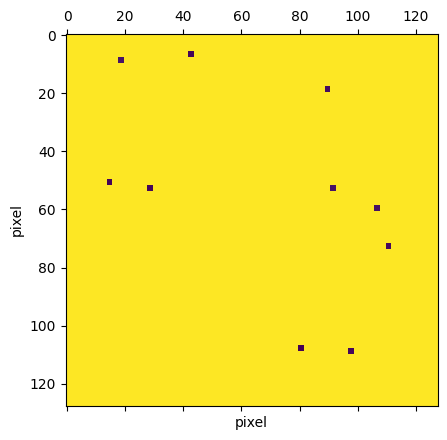

In [ ]:
plt.matshow(video[0])
plt.xlabel('pixel');plt.ylabel('pixel');

To access the indices of the VIP particles, just do:

In [ ]:
np.unique(video[0])

array([ 16,  18,  19,  20,  21,  22,  24,  27,  28,  29, 255], dtype=uint8)

From the previous numbers, 255 is the background and the rest are the indices of the VIP particles.

Let's look at the rest of the video (you may need to install `pillow` (`pip install pillow`) for playing the following):

In [ ]:
from andi_datasets.utils_videos import play_video

In [ ]:
play_video(video[1:,:,:,np.newaxis]) # this functions wants something of shape [num_frames, pixels, pixels, channels], that's why we create new axis

As you can see, there many particles aside of the VIP particles. These will help you to find the ensemble properties of the experiment (more on this below).

### Track 2: trajectories

Track 2 focuses on trajectories, as we did in the [previous challenge](https://doi.org/10.1038/s41467-021-26320-w). The trajectories come in a csv file with four columns: 
- `traj_idx`: index of the trajectory
- `frame`: frame at which each of the time steps was recorded
- `x` and `y`: pixel x and y position.

Let's look at the data:

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv(StartKit_path+'track_2/exp_0/trajs_fov_0.csv')
df

,traj_idx,frame,x,y
0,0.0,0.0,93.654332,104.089646
1,0.0,1.0,93.602970,103.040118
2,0.0,2.0,94.925046,104.376142
3,0.0,3.0,93.559753,102.780234
4,0.0,4.0,92.713807,102.126589
...,...,...,...,...
4429,25.0,195.0,179.430772,132.665685
4430,25.0,196.0,175.963130,130.836672
4431,25.0,197.0,177.304783,129.842511
4432,25.0,198.0,176.402691,131.515115


If you want to access one trajectory, simply do:

In [ ]:
idx_traj = 0
traj = df[df.traj_idx == idx_traj]

In [ ]:
traj

,traj_idx,frame,x,y
0,0.0,0.0,93.654332,104.089646
1,0.0,1.0,93.602970,103.040118
2,0.0,2.0,94.925046,104.376142
3,0.0,3.0,93.559753,102.780234
4,0.0,4.0,92.713807,102.126589
...,...,...,...,...
195,0.0,195.0,89.878535,101.287746
196,0.0,196.0,89.408663,101.777232
197,0.0,197.0,91.881616,102.291826
198,0.0,198.0,91.168064,102.299316


## Creating and submitting predictions

Now that you know how to read the data, let's make some predictions! For the sake of this tutorial, we will generate some dummy data to populate a fake submission file. The submission file structure must be:

```
PATH
│
└─── track_1 
|   │
|   └─── exp_Y
│        │
│        └─── fov_X.txt (predictions for VIP particles for each FOV)
│        │
│        └─── ensemble_labels.txt (predictions at the ensemble level for the whole experiment)
│ 
│
└─── track_2 
    │
    └─── exp_Y
        │
        └─── fov_X.txt (predictions for single trajectories for each FOV)
        │
        └─── ensemble_labels.txt (predictions at the ensemble level for the whole experiment)
```
In our case, we will gather our submission files in the following path:

In [ ]:
import os
path_results = 'res/'
if not os.path.exists(path_results):
    os.makedirs(path_results)

**Important:** You can choose to which track / task you want to participate. For example: 

-> If you want to focus on Track 1, your submission only needs to contain the folder `track_1`.

-> If you want to focus on the Ensemble task, the folders only need to contain the `ensemble_labels.txt` file (no `fov_X.txt` needed)

### Ensemble task
In the ensemble task, you must provide the diffusive property of each state present in the dataset. The file should look like this:

|model: modelXXX;      |  num_state: YYY     |                      |     |
|:--------------------:|:-------------------:|:--------------------:|:---:|
| $\mu_\alpha^1$;      | $\mu_\alpha^2$;     | $\mu_\alpha^3$;      | ... |
| $\sigma_\alpha^1$;   | $\sigma_\alpha^2$;  | $\sigma_\alpha^3$;   | ... |
| $\mu_K^1$;           | $\mu_K^2$;          | $\mu_K^3$;           | ... |        
| $\sigma_K^1$;        | $\sigma_K^2$;       | $\sigma_K^3$;        | ... |
| $N_1$;               | $N_2$;              | $N_3$;               | ... |

It is important to set `;` as delimiter. The first row shows the prediction of the diffusion model. The available models are (an should be written as):

In [ ]:
from andi_datasets.datasets_phenom import datasets_phenom
datasets_phenom().avail_models_name

['single_state',
 'multi_state',
 'immobile_traps',
 'dimerization',
 'confinement']

The rest of the rows are the properties of each diffusive state. Each column represents a different diffusive state. Then, for each found state, you must predict:

- $\mu_\alpha^i$, $\sigma_\alpha^i$: mean and variance of the anomalous diffusion exponent.
- $\mu_K^i$, $\sigma_K^i$: mean and variance of the diffusion coefficient.
- $N_i$: relative weight of each state (e.g. time spent in each state).

Both $\alpha$ and $D$ are bound to some minimal and maximal values:

In [ ]:
from andi_datasets.models_phenom import models_phenom
print(f' Min, max D: {models_phenom().bound_D}\n',
      f'Min, max alpha: {models_phenom().bound_alpha}')

 Min, max D: [1e-12, 1000000.0]
 Min, max alpha: [0, 1.999]


The state weights DOES NOT need to be normalize, the scoring program will take care of normalizing by dividing each weight $N_i$ by their sum (i.e., $\sum_i N_i$).

Let's create a dummy submission. For each track (1 and 2) and experiment (10 in this example), we will create a file with two states and random parameters:

In [ ]:
for track in [1,2]:
    
    # Create the folder of the track if it does not exists
    path_track = path_results+f'track_{track}/'
    if not os.path.exists(path_track):
        os.makedirs(path_track)
        
        
    for exp in range(10):
        
        # Create the folder of the experiment if it does not exits
        path_exp = path_track+f'exp_{exp}/'
        if not os.path.exists(path_exp):
            os.makedirs(path_exp)
        file_name = path_exp + 'ensemble_labels.txt'
        
        with open(file_name, 'a') as f:
            # Save the model (random) and the number of states (2 in this case)
            model_name = np.random.choice(datasets_phenom().avail_models_name, size = 1)[0]
            f.write(f'model: {model_name}; num_state: {2} \n')

            # Create some dummy data for 2 states. This means 2 columns
            # and 5 rows
            data = np.random.rand(5, 2)
            
            data[-1,:] /= data[-1,:].sum()

            # Save the data in the corresponding ensemble file

            np.savetxt(f, data, delimiter = ';')

For instance the file `res/track_1/exp_0/ensemble_labels.txt` should look something like:

```
model: confinement; num_state: 2 
5.928446182250183272e-01;8.442657485810173279e-01
8.579456176227567843e-01;8.472517387841254077e-01
6.235636967859723434e-01;3.843817072926998257e-01
2.975346065444722798e-01;5.671297731744318060e-02
3.633859973276627464e-01;6.366140026723372536e-01
```


### Single trajectory task

Here you will predict the transient properties of each individual trajectory. The trajectories are made of segments of minimum size 5 frames. Your goal is to predict the diffusion coefficient, anomalous exponent and changepoint of each of the segments. The prediction file should look like:

```
idx_traj1, K_1, alpha_1, state_1, CP_1, K_2, alpha_2, .... state_N, T
idx_traj2, K_1, alpha_1, state_1, CP_1, K_2, alpha_2, .... state_N, T
idx_traj3, K_1, alpha_1, state_1, CP_1, K_2, alpha_2, .... state_N, T
...
```
Beware of the comma `,` delimiter here. `idx_trajX` is the index of the trajectory, and `K_x`, `alpha_x` and `state_x` are the diffusion coefficient, anomalous exponent and diffusive state of the $x$-th. `T` is the total length of the trajectory.

> **Important:** for Track 1 (videos), the predictions must only be done for the VIP particles. The idx_traj should coincide with the index given in the first frame of the `.tiff` file, as done above. For Track 2 (trajectories), you must predict all the trajectories in the `.csv` and make sure to correctly match the indices given there to the ones you write in the submission file.

For $K$ and $\alpha$, the bounds are exactly the same as the ones showed above. For the states, we consider 4 different states, each represent by a number:

- `0`: **Immobile**, the particle is spatially trapped. This corresponds to the quenched-trap model (QTM) (`models_phenom.immobile_traps` in the code)
- `1`: **Confined**, the particle is confined within a disk of certain radius. This corresponds to the transient-confinement model (TCM) (`models_phenom.confinement` in the code)
- `2`: **Free**, the particle diffuses normally or anomalously without constraints. Multiple models can generate these states, e.g. single-state model (SSM), Multi-state model (MSM) or the dimerization model (DIM) (`models_phenom.single_state`, `models_phenom.multi_state` and `models_phenom.dimerization`, respectively).
- `3`: **Directed**, the particle diffuses with an $\alpha \geq 1.9$. The above models can produce these states.

To know more about each model and state, you can check [this tutorial](challenge_two_datasets.ipynb).

As before, we will create some dummy submission. To showcase the fact that you can participate just in some Tracks / Tasks, we will generate predictions only for Track 2. While we will not do predictions for Track 1 here, remember that for that track you only need to predict the VIP particles!

In [ ]:
# Define the number of experiments and number of FOVS
N_EXP = 10 
N_FOVS = 30

# We only to track 2 in this example
track = 2

# The results go in the same folders generated above
path_results = 'res/'
path_track = path_results+f'track_{track}/'

for exp in range(N_EXP):
    
    path_exp = path_track+f'exp_{exp}/'
    
    for fov in range(N_FOVS):
        
        # We read the corresponding csv file from the public data and extract the indices of the trajectories:
        df = pd.read_csv(StartKit_path+f'track_2/exp_{exp}/trajs_fov_{fov}.csv')
        traj_idx = df.traj_idx.unique()
        
        submission_file = path_exp + f'fov_{fov}.txt'
        
        with open(submission_file, 'a') as f:
            
            # Loop over each index
            for idx in traj_idx:
                
                # Get the lenght of the trajectory
                length_traj = df[df.traj_idx == traj_idx[0]].shape[0]
                # Assign one changepoints for each traj at 0.25 of its length
                CP = int(length_traj*0.25)
                
                prediction_traj = [idx.astype(int), 
                                   np.random.rand()*10, # K1
                                   np.random.rand(), # alpha1
                                   np.random.randint(4), # state1
                                   CP, # changepoint
                                   np.random.rand()*10, # K2
                                   np.random.rand(), # alpha2
                                   np.random.randint(4), # state2
                                   length_traj # Total length of the trajectory
                                  ]
                
                formatted_numbers = ','.join(map(str, prediction_traj))
                f.write(formatted_numbers + '\n')
            
            



The first lines of `res/track_2/exp_0/fov_0.txt` should be:

```
0,3.2001715082246784,0.38346389417189797,3,50,3.2468297206646533,0.5197111936582762,0,200
1,8.726506554473954,0.27354203481563577,1,50,8.853376596095856,0.6798794564067695,3,200
2,6.874882763878153,0.21550767711355845,1,50,2.294418344710454,0.8802976031150046,0,200
```

### Creating the submission and uploading to codalab

Now you are ready to create a submission file. The only thing you need is to zip the folders.

> **Important:** You must compress the file so that `track_1` and/or `track_2` are directly on the parent folder of the compressed file. Be careful not compressing the parent folder and then having a zip that has first a `res` folder and inside the track folders!

Then, go to the competition webpage in Codalab > Participate > Submit/View Results and use the submission button to submit the compressed file. After some time, you will see the results in the Leaderboard. If something went wrong, you will be able to see it in the same Submission page.

## Create and work on your own datasets

In the Codalab webpage we also provide a Starting Kit, containing both videos, trajectories but most importantly their respective labels. You can use these to train your own models. Moreover, we will show how to create a dataset similar to that given in the competition page to train and/or validate your models at will.

### The starting kit

You can download the starting in the competition webpage > Participate > Files. 

```
starting_kit
│
└─── track_1 (videos)
|   │
|   └─── exp_Y
│        │
│        └─── videos_fov_X.tiff (video for each fov)
│        │
│        └─── ensemble_labels.txt (information at the ensemble level for the whole experiment)
│        │
│        └─── traj_labs_fov_X.txt (information for each trajectory for the whole experiment)
│        │
│        └─── ens_labs_fov_X.txt (information at the ensemble level for each FOV)
│        │
│        └─── vip_idx_fov_X.txt (index of VIP particles)
│ 
│
└─── track_2 (trajectories)
    │
    └─── exp_Y
        │
        └─── traj_fov_X.txt (trajectories for each FOV) 
        │
        └─── ensemble_labels.txt (information at the ensemble level for the whole experiment)
        │
        └─── traj_labs_fov_X.txt (information for each trajectory for the whole experiment)
        │
        └─── ens_labs_fov_X.txt (information at the ensemble level for each FOV)
```

Instead of working here with the Starting Kit, we will instead generate a similar dataset with the `andi_datasets` library.


### Generating the ANDI 2 challenge dataset

Here we showcase how to generate the exact same dataset used as training / public dataset in the Codalab competition. 

In [ ]:
# Functions needed from andi_datasets
from andi_datasets.datasets_challenge import challenge_phenom_dataset, _get_dic_andi2, _defaults_andi2

#### Defining the dataset properties

**Setting a single FOV per experiment:** In order to have the most heterogeneous dataset, we will avoid overlapping FOVs by generating various experiments for each condition and then a single FOV for each of this. Then, the generator function will take of reorganizing the dataset in the proper challenge structure.

Our goal is to have 10 experiments (2 per phenomenological model) with 30 FOVs each. This means that we will generate 300 independent experiments, but considering that batches of 30 have the exact same properties. After generating this data, we will reorganize the dataset to have the structure proposed in the challenge.

We will follow a common pattern: 
1. First experiment for each model will be sampled from the default parameters (given by `_get_dic_andi2` and defined in `_defaults_andi2`)
2. Second experiment will be an "easy" one, in which the different states will be clearly differentiated. We will also do some tweaks to make them interesting!

We can take a look at `_defaults_andi` to get the defaults values:

In [ ]:
_defaults_andi2??

Init signature: _defaults_andi2()
Source:        
class _defaults_andi2: 
    '''
    This class defines the default values set for the ANDI 2 challenge.
    '''
    def __init__(self):        
        # General parameters

        self.T = 500                   # Length of simulated trajectories
        self._min_T = 20               # Minimal length of output trajectories
        self.FOV_L = 128               # Length side of the FOV (px)
        self.L = 1.8*self.FOV_L          # Length of the simulated environment
        self.D = 1                     # Baseline diffusion coefficient (px^2/frame)
        self.density = 2               # Particle density   
        self.N = 50                    # Number of particle in the whole experiment
        self.sigma_noise = 0.12        # Variance of the localization noise

        self.label_filter = lambda x: label_filter(x, window_size = 5, min_seg = 3)
File:           ~/github/andi_datasets/andi_datasets/datasets_challenge.py
Type:    

Now let's create the dictionaries describing the experiments:

In [ ]:
# You can change the following to value this at will. The public dataset is made 10 Experiments of 30 FOVs each
EXPERIMENTS = np.arange(2)
NUM_FOVS = 1
PATH = 'andi2_dataset/' # Chose your path!

# import stochastic
# stochastic.random.seed(1)

dics = []
current_idx_model = 0
for idx, i in enumerate(EXPERIMENTS):  
    
    
    # We use the default values to generate an initial dictionary
    dic = _get_dic_andi2(i+1) 
    dic['T'] = 200
    dic['N'] = 100
    
    
    # Now we set the parameters different experiments:
    
    #### SINGLE STATE ####
    if i == 0:
        
        if idx % 2 == 0: pass # default values    
        else:
            dic['alphas'] = np.array([1.5, 0.01])
            dic['Ds'] = np.array([0.01, 0.01])
            
            
    #### MULTI STATE ####
    if i == 1:
        if idx % 2 == 0: pass # default values 
    
        else: # 3-state model with various alphas            
            dic['Ds'] = np.array([[0.99818417, 0.01      ],
                                  [0.08012007, 0.01      ],
                                  [1.00012007, 0.01      ]])

            dic['alphas'] = np.array([[0.84730977, 0.01      ],
                                      [0.39134136, 0.01      ],
                                      [1.51354654, 0.01]])

            dic['M'] = np.array([[0.98, 0.01, 0.01],
                                 [0.01, 0.98, 0.01],
                                 [0.01, 0.01, 0.98]])  
            
    #### IMMOBILE TRAPS ####
    if i == 2:
        if idx % 2 == 0: 
            # Because the next one will be easy, we set this one to a difficult alpha (subdiffusive)
            # We pump D to ensure exploration
            dic['alphas'] = np.array([0.2, 0.01      ])
            dic['Ds'] = np.array([5, 0.01      ])
        else:
            dic['alphas'] = np.array([1.9, 0.01      ])
            
    
    #### DIMERIZATION ####
    if i == 3:
        if idx % 2 == 0: pass # default values    
        else:
            dic['Ds'] = np.array([[1.2, 0.01      ],
                                  [0.02, 0.01      ]])

            dic['alphas'] = np.array([[1.5, 0.01      ],
                                      [0.5, 0.01      ]])
            
    #### CONFINEMENT ####
    if i == 4:
        if idx % 2 == 0: pass # default values    
        else:
            dic['Ds'] = np.array([[1.02, 0.01      ],
                                  [0.01, 0.01      ]])

            dic['alphas'] = np.array([[1.8, 0.01      ],
                                      [0.9, 0.01      ]])
            
    
    for _ in range(NUM_FOVS):
        dics.append(dic)

    current_idx_model += 1

We can now use the function `datasets_challenge.challenge_phenom_dataset` to generate our dataset. If not set, this functions saves files in `PATH` (see the documentation of the function to know more). For training your methods, this may be appropriate. However, in some cases you may want to keep the same structure as shown in the Starting Kit. To do so, we use the variables `files_reorg = True` and subsequent:

In [ ]:
dfs_traj, videos, labs_traj, labs_ens = challenge_phenom_dataset(save_data = True, # If to save the files
                                                                dics = dics, # Dictionaries with the info of each experiment (and FOV in this case)
                                                                path = PATH, # Parent folder where to save all data
                                                                return_timestep_labs = True, get_video = True, 
                                                                num_fovs = 1, # Number of FOVs                                                                
                                                                num_vip=10, # Number of VIP particles
                                                                files_reorg = True, # We reorganize the folders for challenge structure
                                                                path_reorg = 'ref/', # Folder inside PATH where to reorganized
                                                                save_labels_reorg = True, # The labels for the two tasks will also be saved in the reorganization                                                                 
                                                                delete_raw = True # If deleting the original raw dataset
                                                                )

  0%|          | 0/2 [00:00<?, ?it/s]

Creating dataset for Exp_0 (single_state).
Generating video for EXP 0 FOV 0
Creating dataset for Exp_1 (multi_state).
Generating video for EXP 1 FOV 0


Aside of the generated data, we also get some outputs from this function:

- `dfs_traj`: a list of dataframes, one for each experiment / fov, which contains the info that was saved in the `.csv`. If `return_timestep_labs = True`, then the dataframe also contains the diffusive parameters of each frame.

In [ ]:
dfs_traj[0]

,traj_idx,frame,x,y,alpha,D,state
0,0.0,18.0,124.892324,19.204098,0.592591,0.885770,2.0
1,0.0,19.0,126.511436,19.305087,0.592591,0.885770,2.0
2,0.0,20.0,126.197563,21.030422,0.592591,0.885770,2.0
3,0.0,21.0,129.700339,20.707369,0.592591,0.885770,2.0
4,0.0,22.0,129.239501,21.795457,0.592591,0.885770,2.0
...,...,...,...,...,...,...,...
6221,38.0,195.0,66.258704,20.676069,0.553593,0.895989,2.0
6222,38.0,196.0,67.272088,20.338184,0.553593,0.895989,2.0
6223,38.0,197.0,66.160404,21.348238,0.553593,0.895989,2.0
6224,38.0,198.0,65.895880,19.667382,0.553593,0.895989,2.0


- `videos`: contains the arrays from where the videos will be generated. They have similar shape as the ones we loaded at the beginning of this notebook:

In [ ]:
play_video(videos[0][1:])

- `labs_traj` a list of lists containing the labels for each trajectory in similar form as the ones you are asked to submit as `fov.txt`:

In [ ]:
labs_traj[0][:10]

[[0, 1.1236012281768861, 1.0331045678718274, 2.0, 46],
 [1, 1.1595223945376247, 0.9422760723440122, 2.0, 200],
 [2, 1.0752862372656447, 0.9858771716836071, 2.0, 174],
 [3, 1.0752862372656447, 0.9858771716836071, 2.0, 22],
 [4, 1.029927660196135, 0.8408724154169402, 2.0, 200],
 [5, 0.8447116390690012, 1.1005734714909277, 2.0, 27],
 [6, 0.8447116390690012, 1.1005734714909277, 2.0, 24],
 [7, 0.8447116390690012, 1.1005734714909277, 2.0, 38],
 [8, 0.8447116390690012, 1.1005734714909277, 2.0, 26],
 [9, 0.8447116390690012, 1.1005734714909277, 2.0, 34]]

- `labs_ens` a list of numpy arrays which contain the ensemble labels for each fov generated:

In [ ]:
labs_ens

[array([[1.0488135e+00],
        [1.0000000e-02],
        [1.0000000e+00],
        [1.0000000e-02],
        [6.0540000e+03]]),
 array([[8.47309770e-01, 3.91341360e-01, 1.51354654e+00],
        [1.00000000e-02, 1.00000000e-02, 1.00000000e-02],
        [9.98184170e-01, 8.01200700e-02, 1.00012007e+00],
        [1.00000000e-02, 1.00000000e-02, 1.00000000e-02],
        [1.67800000e+03, 1.53800000e+03, 1.94000000e+03]])]

### Scoring your predictions

All the scoring programs used in codalab are also available in the library. Here is an example with the dataset we just generated. 

To simplify, we will use the same dataset we just generated as submission. **We will consider here only Track 2**. As groundtruth and predictions are the same, the metrics will always be perfect! 

The structure for a prediction is the same as the one presented in Section `Creating and submitting predictions`. For the program to work, the groundtruth /reference must be in a folder called `ref` and the predictions / results in a folder called `res`, both placed in the `PATH`. The whole structure should be as following:

```
PATH
│
└─── ref (the one you created above. Should contain labels, i.e. save_labels = True)
|
└─── res (the one containing your predictions, same structure as for a submission)
    │
    └─── track_1 
    |   │
    |   └─── exp_Y
    │        │
    │        └─── fov_X.txt (predictions for VIP particles for each FOV)
    │        │
    │        └─── ensemble_labels.txt (predictions at the ensemble level for the whole experiment)
    │ 
    │
    └─── track_2 
        │
        └─── exp_Y
            │
            └─── fov_X.txt (predictions for single trajectories for each FOV)
            │
            └─── ensemble_labels.txt (predictions at the ensemble level for the whole experiment)
```

As we commented above, you can choose to participate just in one of the tracks (video or trajectories) or tasks (ensemble or single trajectory). This will not rise an error in the scoring program, just `None` predictions to the rest. As we are here participating just in Track 2, all scores for Track 1 will be set to their maximum possible values (these can be found in the challenge description or in `utils_challenge._get_error_bounds`.

> **Note:** You can skip the following if you have created your own predictions.

To proceed, make a duplicate of the `ref` folder, name the new copy `res`, and delete `res/track_1` folder. Then, we can use the following function to transform the reference dataset into a submission dataset (mostly changes the names of the files `traj_labs_fov_X.txt` into `fov_X.txt`.

In [ ]:
from andi_datasets.utils_challenge import transform_ref_to_res

transform_ref_to_res(base_path = PATH + 'res/',
                     track = 'track_2',
                     num_fovs = NUM_FOVS)    

To score your predictions, you just need to run:

In [ ]:
from andi_datasets.utils_challenge import codalab_scoring

In [ ]:
PATH = 'andi2_dataset/'

In [ ]:
codalab_scoring(INPUT_DIR = PATH,
                OUTPUT_DIR = '.')

The warnings give you important information about missing tracks, tasks and others. The results are then give in two formats: 

- `scores.txt`: this file contains the average values over all experiments for the different Tracks and Tasks. If you followed this example and didn't include you own predictions, it should look like this:

```
tr1.ta1.alpha: 2
tr1.ta1.D: 100000.0
tr1.ta1.state: 0
tr1.ta1.cp: 10
tr1.ta1.JI: 0
tr1.ta2.alpha: 1.999
tr1.ta2.D: 1000000.0
tr2.ta1.cp: 0.0
tr2.ta1.JI: 1.0
tr2.ta1.alpha: 0.0
tr2.ta1.D: 0.0
tr2.ta1.state: 1.0
tr2.ta2.alpha: 0.0
tr2.ta2.D: 0.0
```
`trX.taY.ZZ` refer to the track X, task Y and property ZZ. As you can see, because in our example we only considered Track 2, all results for Track 1 are set the their maximum possible values. The rest are the best score that can be achieved in each task (as reference = submissions).



- `html/scores.html`: contains a summary of the results for each track / task. It contains the following tables, with numbers similar to:


<center><h3> Task 1: single </h3>
<table border="1" class="dataframe" style="width:50%">  <thead>    <tr style="text-align: right;">      <th>Experiment</th>      <th>num_trajs</th>      <th>RMSE CP</th>      <th>JSC CP</th>      <th>alpha</th>      <th>D</th>      <th>state</th>    </tr>  </thead>  <tbody>    <tr>      <td>0</td>      <td>129</td>      <td>0.0</td>      <td>1.0</td>      <td>0.0</td>      <td>0.0</td>      <td>1.0</td>    </tr>    <tr>      <td>1</td>      <td>95</td>      <td>0.0</td>      <td>1.0</td>      <td>0.0</td>      <td>0.0</td>      <td>1.0</td>    </tr>  </tbody></table></center>



<center><h3> Task 2: ensemble </h3>
<table border="1" class="dataframe" style="width:50%">  <thead>    <tr style="text-align: right;">      <th>Experiment</th>      <th>alpha</th>      <th>D</th>    </tr>  </thead>  <tbody>    <tr>      <td>0.0</td>      <td>0.0</td>      <td>0.0</td>    </tr>    <tr>      <td>1.0</td>      <td>0.0</td>      <td>0.0</td>    </tr>  </tbody></table> </center>


Now you can adapt this code to locally test your submissions. We also encourage you to check the documentation of `utils_challenge.run_single_task` and `utils_challenge.run_ensemble_task` to know more of what is going on in the scoring program!